In [1]:
import pandas as pd
import numpy as np

In [2]:
train_data= pd.read_csv("Train_data_liv_tox_18636.csv")
train_data = train_data[~train_data.Source_rank.isin([4, 9, 12])].reset_index(drop=True)
train_data

,smiles_r,TOXICITY,Source_rank,Source,Data,Mfp0,Mfp1,Mfp2,Mfp3,Mfp4,...,SRW09,SRW10,TSRW10,MW,AMW,WPath,WPol,Zagreb1,Zagreb2,mZagreb2
0,C[C@H](N)C(=O)N[C@@H](C)C(=O)NC1[C@@H]2CN(c3nc...,1,2,"Liver Toxicity Knowledge Base (LTKB), prescrip...",LivTox,0,1,0,0,0,...,8.355850,10.869311,98.746533,558.183853,8.587444,5797.0,69.0,222.0,271.0,8.472222
1,CN(C)CCCC1c2ccccc2Nc2ccc(Cl)cc21,1,2,"Liver Toxicity Knowledge Base (LTKB), prescrip...",LivTox,0,0,0,0,0,...,0.000000,10.024244,55.050898,300.139326,7.146174,896.0,33.0,110.0,129.0,4.611111
2,NC(N)=Nc1nc(CSCCN=CNS(=O)(=O)c2ccc(Br)cc2)cs1,1,2,"Liver Toxicity Knowledge Base (LTKB), prescrip...",LivTox,0,0,0,0,0,...,6.555357,9.844533,73.704745,475.975849,11.069206,2264.0,32.0,126.0,139.0,5.791667
3,O=c1[nH]c(=O)n([C@@H]2O[C@H](CO)[C@@H](O)[C@@H...,1,2,"Liver Toxicity Knowledge Base (LTKB), prescrip...",LivTox,0,0,0,0,0,...,7.002156,9.881191,65.574603,371.961848,13.284352,573.0,30.0,94.0,113.0,4.000000
4,CN1CCCC(CN2c3ccccc3Sc3ccccc32)C1,1,2,"Liver Toxicity Knowledge Base (LTKB), prescrip...",LivTox,0,0,0,0,0,...,0.000000,10.137017,56.550528,310.150370,7.048872,982.0,36.0,120.0,143.0,4.777778
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15075,C[C@@H](c1ncncc1F)[C@](O)(Cn1cncn1)c1ccc(F)cc1F,0,16,Reactive Metabolite Mazzolari et al,LivTox,0,1,0,0,0,...,6.259581,10.241209,73.142299,349.115045,8.951668,1359.0,41.0,132.0,157.0,5.458333
15076,COC[C@H]1OC(=O)c2coc3c2[C@@]1(C)C1=C(C3=O)[C@@...,0,16,Reactive Metabolite Mazzolari et al,LivTox,0,0,0,0,0,...,7.669962,10.959036,84.585213,428.147118,7.784493,2102.0,69.0,184.0,237.0,6.513889
15077,CCOC(=O)CN[C@@H](C(=O)N1CC[C@H]1C(=O)NCc1ccc(/...,0,16,Reactive Metabolite Mazzolari et al,LivTox,0,1,1,0,0,...,0.000000,10.360058,70.097297,473.263819,6.858896,4012.0,50.0,168.0,194.0,7.833333
15078,C=C(C)[C@@]12OC3(/C=C/C=C/CCCCC)O[C@@H]1[C@@H]...,0,16,Reactive Metabolite Mazzolari et al,LivTox,0,0,0,0,0,...,8.945724,11.424389,108.553825,648.293448,7.124104,6986.0,109.0,278.0,362.0,10.138889


In [3]:
train_data.Source_rank.value_counts()

15    6111
7     2750
3     1582
8     1230
14     763
6      738
5      602
11     556
16     502
10     143
2      103
Name: Source_rank, dtype: int64

In [4]:
test_data_ncv= pd.read_csv("test_data_ncv_DILIst_1020.csv")
test_data_heldouttest= pd.read_csv("test_data_heldouttest_DILIst_255.csv")

In [5]:
test_data_ncv["DILI"]="NCV"
test_data_heldouttest["DILI"]="Held-out"

In [6]:
df = pd.concat([train_data, test_data_ncv, test_data_heldouttest])
df=df[["smiles_r", "TOXICITY", "Source_rank", "Source", "Data", "DILI"]].reset_index(drop=True)
df.to_csv("datawarrioranalysis_allcompounds_16355.csv", index=False)

In [7]:
df

,smiles_r,TOXICITY,Source_rank,Source,Data,DILI
0,C[C@H](N)C(=O)N[C@@H](C)C(=O)NC1[C@@H]2CN(c3nc...,1,2,"Liver Toxicity Knowledge Base (LTKB), prescrip...",LivTox,NaN
1,CN(C)CCCC1c2ccccc2Nc2ccc(Cl)cc21,1,2,"Liver Toxicity Knowledge Base (LTKB), prescrip...",LivTox,NaN
2,NC(N)=Nc1nc(CSCCN=CNS(=O)(=O)c2ccc(Br)cc2)cs1,1,2,"Liver Toxicity Knowledge Base (LTKB), prescrip...",LivTox,NaN
3,O=c1[nH]c(=O)n([C@@H]2O[C@H](CO)[C@@H](O)[C@@H...,1,2,"Liver Toxicity Knowledge Base (LTKB), prescrip...",LivTox,NaN
4,CN1CCCC(CN2c3ccccc3Sc3ccccc32)C1,1,2,"Liver Toxicity Knowledge Base (LTKB), prescrip...",LivTox,NaN
...,...,...,...,...,...,...
16350,NCC(O)c1ccc(O)c(O)c1,0,1,DILIst Classification Intravenous,DILI,Held-out
16351,Cc1nnc(SCC2=C(C(=O)O)N3C(=O)C(NC(=O)Cn4cnnn4)C...,1,1,DILIst Classification Intravenous,DILI,Held-out
16352,COc1cc(NC(C)CCCN)c2ncccc2c1,0,1,DILIst Classification Oral,DILI,Held-out
16353,CC12CCC3c4ccc(O)cc4CCC3C1CCC2O,1,1,DILIst Classification Oral,DILI,Held-out


In [8]:
for i in df.Data.unique():
    print(i)
    print(df[df["Data"]==i]["TOXICITY"].value_counts())

LivTox
0    9176
1    5904
Name: TOXICITY, dtype: int64
DILI
1    820
0    455
Name: TOXICITY, dtype: int64


In [9]:
for i in df.Source_rank.unique():
    print(i)
    print(df[df["Source_rank"]==i]["TOXICITY"].value_counts())

2
1    77
0    26
Name: TOXICITY, dtype: int64
3
1    933
0    649
Name: TOXICITY, dtype: int64
5
0    399
1    203
Name: TOXICITY, dtype: int64
6
1    410
0    328
Name: TOXICITY, dtype: int64
7
1    2112
0     638
Name: TOXICITY, dtype: int64
8
0    764
1    466
Name: TOXICITY, dtype: int64
10
0    72
1    71
Name: TOXICITY, dtype: int64
11
1    286
0    270
Name: TOXICITY, dtype: int64
14
0    409
1    354
Name: TOXICITY, dtype: int64
15
0    5237
1     874
Name: TOXICITY, dtype: int64
16
0    384
1    118
Name: TOXICITY, dtype: int64
1
1    698
0    425
Name: TOXICITY, dtype: int64
13
1    122
0     30
Name: TOXICITY, dtype: int64


In [10]:
from rdkit import Chem, DataStructs
from rdkit.Chem import Descriptors,Crippen

def GetExactMolWt(s):
    mol = Chem.MolFromSmiles(s)
    return (Descriptors.ExactMolWt (mol))
def GetCalcTPSA(s):
    mol = Chem.MolFromSmiles(s)
    return (Chem.rdMolDescriptors.CalcTPSA(mol))
def GetNumRotatableBonds(s):
    mol = Chem.MolFromSmiles(s)
    return (Descriptors.NumRotatableBonds (mol))
def GetNumHDonors(s):
    mol = Chem.MolFromSmiles(s)
    return (Descriptors.NumHDonors(mol))
def GetNumHAcceptors(s):
    mol = Chem.MolFromSmiles(s)
    return (Descriptors.NumHAcceptors(mol) )
def GetMolLogP(s):
    mol = Chem.MolFromSmiles(s)
    return (Descriptors.MolLogP(mol))

In [11]:
from pandarallel import pandarallel
pandarallel.initialize(progress_bar=False)

INFO: Pandarallel will run on 56 workers.
INFO: Pandarallel will use Memory file system to transfer data between the main process and workers.


In [12]:
df['MolWt']=df['smiles_r'].parallel_apply(GetExactMolWt)
df['TPSA']=df['smiles_r'].parallel_apply(GetCalcTPSA) #Topological Polar Surface Area
df['nRotB']=df['smiles_r'].parallel_apply(GetNumRotatableBonds) #Number of rotable bonds
df['HBD']=df['smiles_r'].parallel_apply(GetNumHDonors) #Number of H bond donors
df['HBA']=df['smiles_r'].parallel_apply(GetNumHAcceptors) #Number of H bond acceptors
df['LogP']=df['smiles_r'].parallel_apply(GetMolLogP) #LogP

[00:16:55] WARNING: not removing hydrogen atom without neighbors
[00:16:55] WARNING: not removing hydrogen atom without neighbors
[00:16:55] WARNING: not removing hydrogen atom without neighbors
[00:16:55] WARNING: not removing hydrogen atom without neighbors
[00:16:55] WARNING: not removing hydrogen atom without neighbors
[00:16:55] WARNING: not removing hydrogen atom without neighbors
[00:16:56] WARNING: not removing hydrogen atom without neighbors
[00:16:56] WARNING: not removing hydrogen atom without neighbors
[00:16:56] WARNING: not removing hydrogen atom without neighbors
[00:16:56] WARNING: not removing hydrogen atom without neighbors
[00:16:56] WARNING: not removing hydrogen atom without neighbors
[00:16:56] WARNING: not removing hydrogen atom without neighbors
[00:16:57] WARNING: not removing hydrogen atom without neighbors
[00:16:57] WARNING: not removing hydrogen atom without neighbors
[00:16:57] WARNING: not removing hydrogen atom without neighbors
[00:16:57] WARNING: not r

In [13]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

# data scaling

pca = PCA(n_components=2)

features_Std = StandardScaler().fit_transform(df[["MolWt",  "TPSA", "nRotB" , "HBD", "HBA", "LogP"]])
pca_res = pca.fit_transform(features_Std)

print('Shape before PCA: ', pca_res.shape)
print('Shape after PCA: ', pca_res.shape)

pca_df = pd.DataFrame(
    data=pca_res, 
    columns=['PC1', 'PC2'])

Shape before PCA:  (16355, 2)
Shape after PCA:  (16355, 2)


In [14]:
df['PC1'] = pca_df['PC1'] 
df['PC2'] = pca_df['PC2'] 

In [15]:
import numpy as np
pcv_1 = np.round(pca.explained_variance_ratio_[0], 4)*100
pcv_2 = np.round(pca.explained_variance_ratio_[1], 4)*100
print(pcv_1, pcv_2)

63.24999999999999 23.28


In [16]:
63.24999999999999 +23.28

86.53

In [ ]:
from sklearn.manifold import TSNE
tsne_res = TSNE(n_components=2, n_jobs=-1, verbose=2).fit_transform(features_Std)

tsne_df = pd.DataFrame(data=tsne_res, columns=['tsne_1', 'tsne_2'])

/home/ss2686/miniconda3/envs/my-rdkit-env/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:795: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/ss2686/miniconda3/envs/my-rdkit-env/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:805: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 16355 samples in 0.025s...
[t-SNE] Computed neighbors for 16355 samples in 1.085s...
[t-SNE] Computed conditional probabilities for sample 1000 / 16355
[t-SNE] Computed conditional probabilities for sample 2000 / 16355
[t-SNE] Computed conditional probabilities for sample 3000 / 16355
[t-SNE] Computed conditional probabilities for sample 4000 / 16355
[t-SNE] Computed conditional probabilities for sample 5000 / 16355
[t-SNE] Computed conditional probabilities for sample 6000 / 16355
[t-SNE] Computed conditional probabilities for sample 7000 / 16355
[t-SNE] Computed conditional probabilities for sample 8000 / 16355
[t-SNE] Computed conditional probabilities for sample 9000 / 16355
[t-SNE] Computed conditional probabilities for sample 10000 / 16355
[t-SNE] Computed conditional probabilities for sample 11000 / 16355
[t-SNE] Computed conditional probabilities for sample 12000 / 16355
[t-SNE] Computed conditional probabilities for sam

In [ ]:
df['tsne_1'] = tsne_df['tsne_1'] 
df['tsne_2'] = tsne_df['tsne_2'] 
df

<AxesSubplot:xlabel='PC1', ylabel='PC2'>

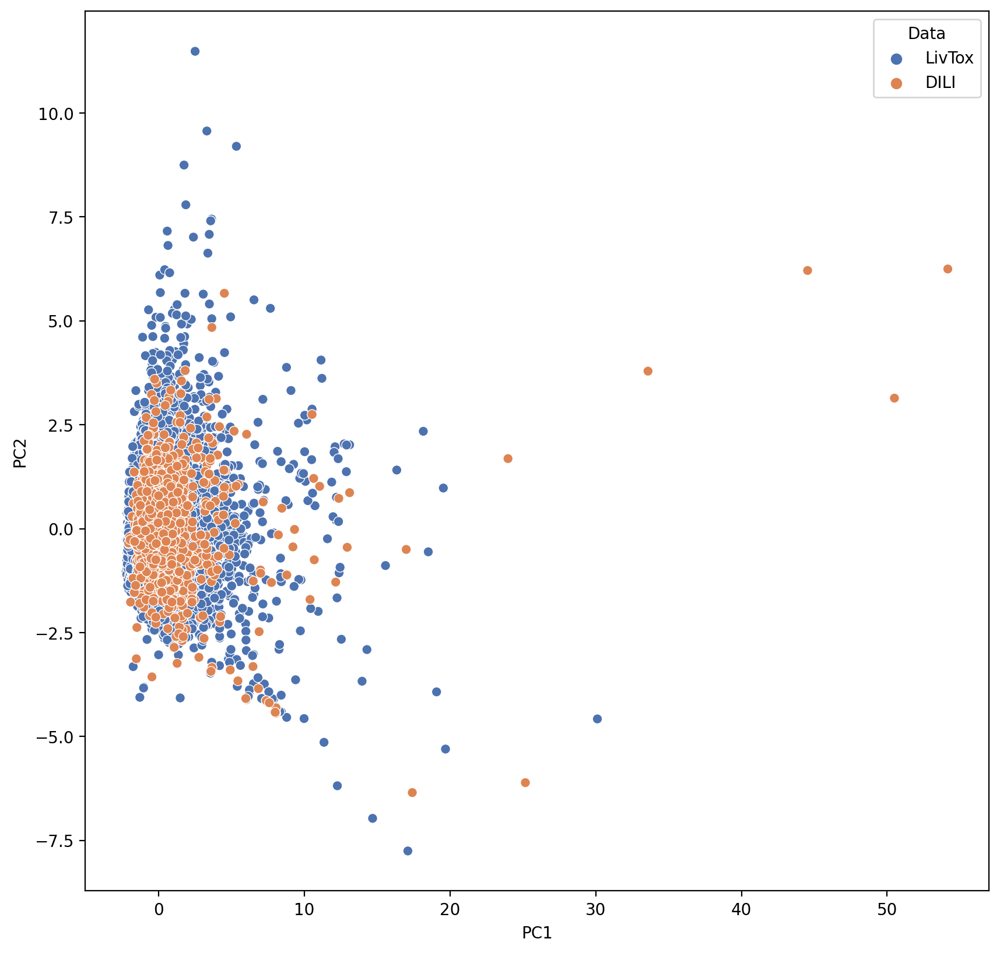

In [4]:
import matplotlib.pyplot as plt
import seaborn as sns

fig, ax = plt.subplots(figsize=(10, 10), dpi=200)
sns.scatterplot(data=df, x="PC1", y="PC2", hue="Data", palette="deep")

<AxesSubplot:xlabel='PC1', ylabel='PC2'>

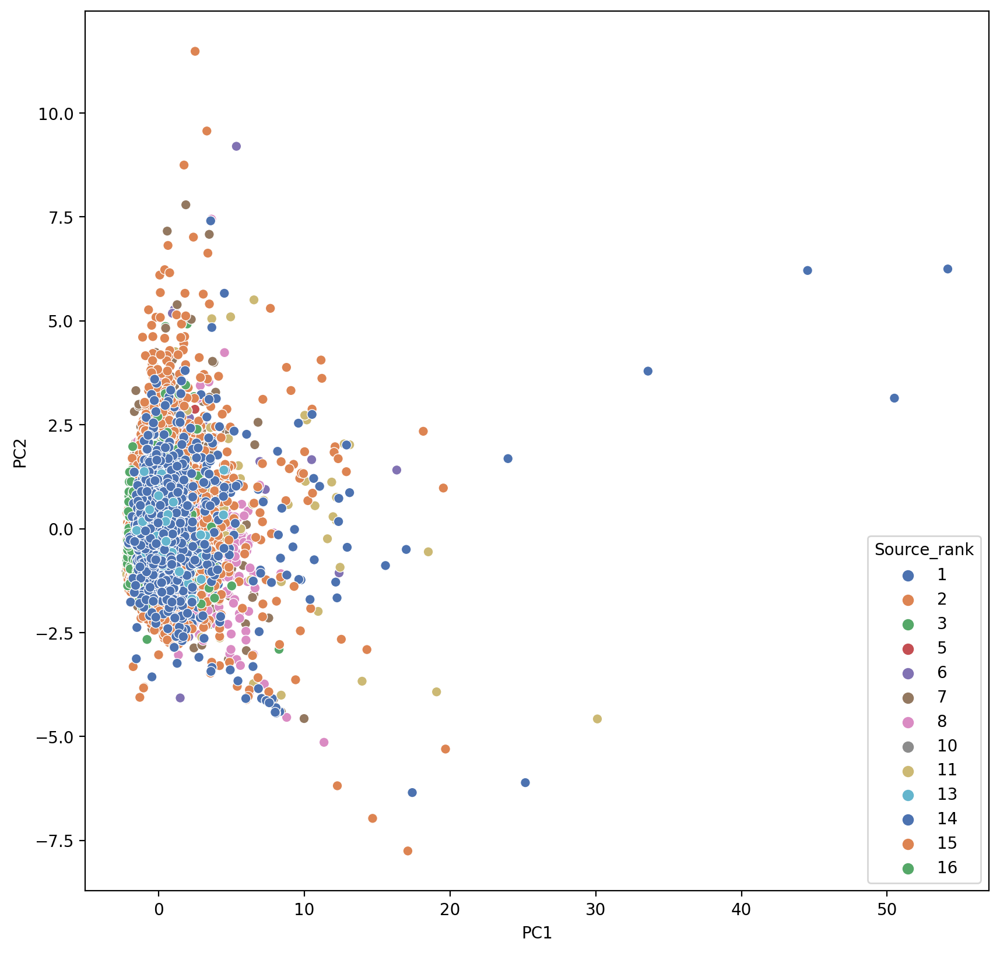

In [5]:
fig, ax = plt.subplots(figsize=(10, 10), dpi=200)
sns.scatterplot(data=df, x="PC1", y="PC2", hue="Source_rank", palette="deep")

<AxesSubplot:xlabel='tsne_1', ylabel='tsne_2'>

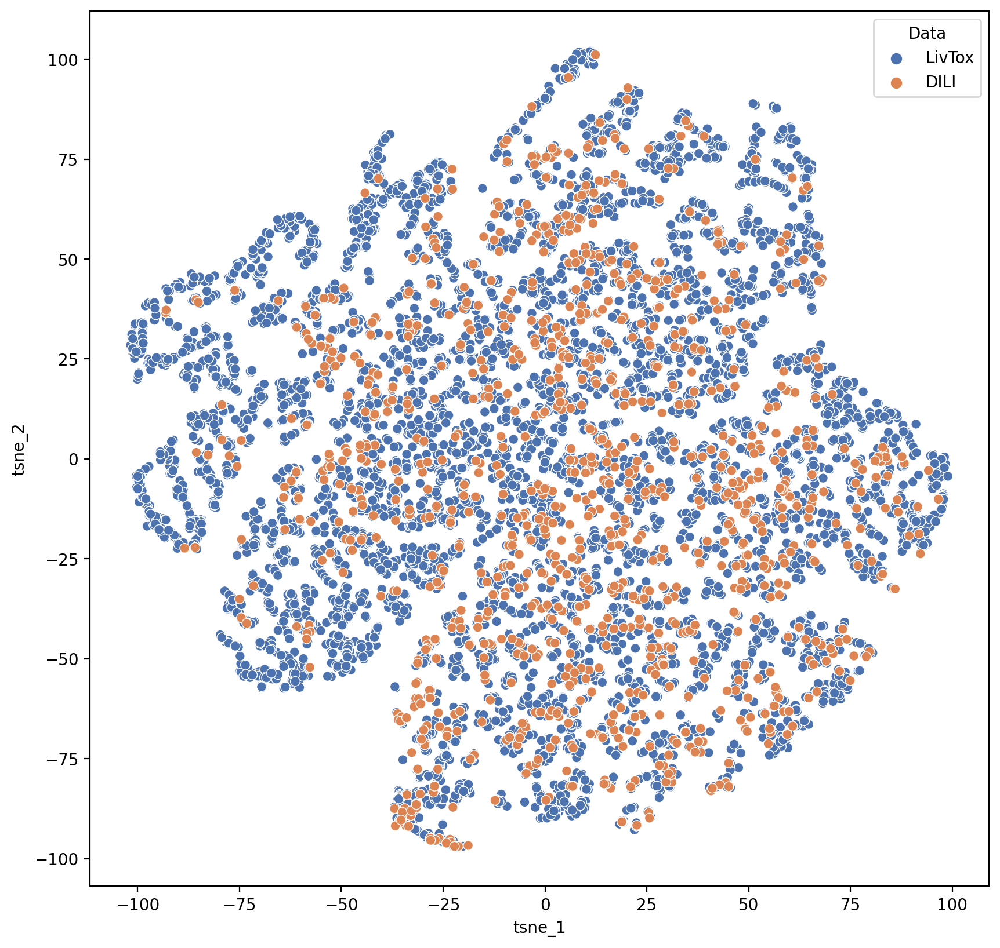

In [6]:
fig, ax = plt.subplots(figsize=(10, 10), dpi=200)
sns.scatterplot(data=df, x="tsne_1", y="tsne_2", hue="Data", palette="deep")

<AxesSubplot:xlabel='tsne_1', ylabel='tsne_2'>

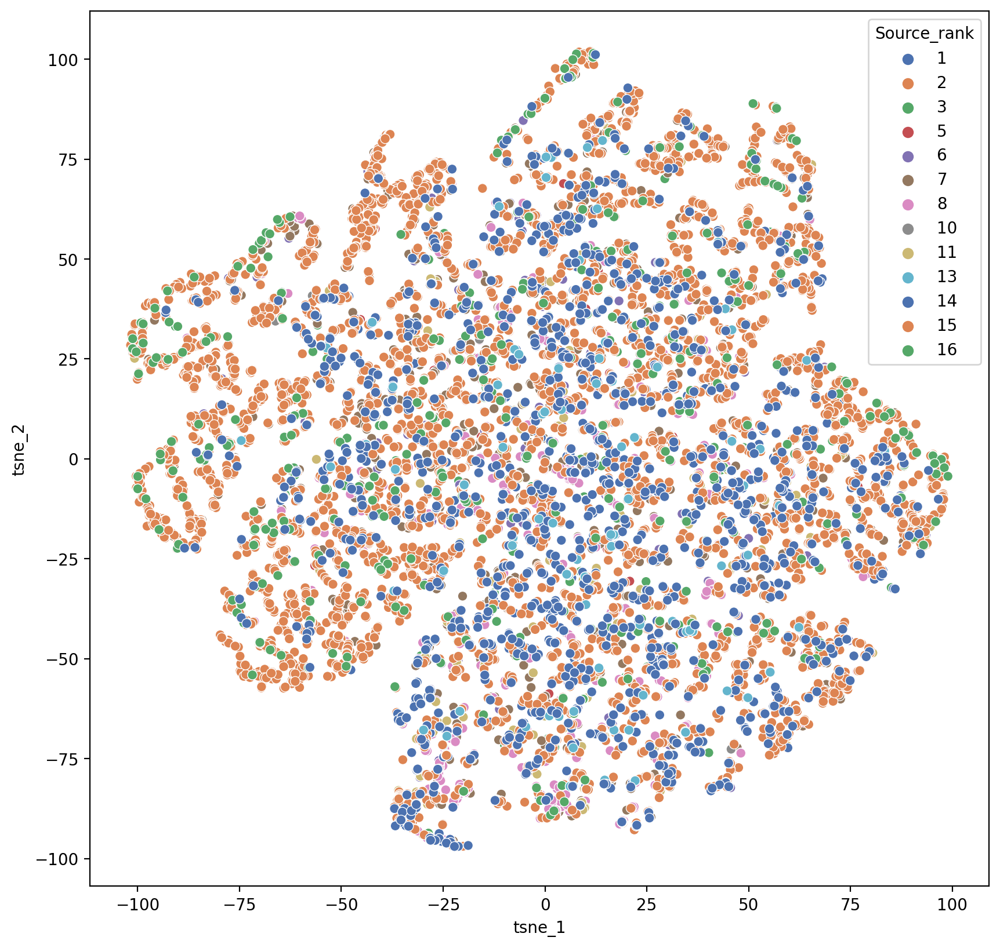

In [7]:
fig, ax = plt.subplots(figsize=(10, 10), dpi=200)
sns.scatterplot(data=df, x="tsne_1", y="tsne_2", hue="Source_rank", palette="deep")

In [8]:
df=df[["smiles_r", "Data", "DILI", "Source_rank", "PC1","PC2","tsne_1","tsne_2", "TOXICITY"]]
df

,smiles_r,Data,DILI,Source_rank,PC1,PC2,tsne_1,tsne_2,TOXICITY
0,C[C@H](N)C(=O)N[C@@H](C)C(=O)NC1[C@@H]2CN(c3nc...,LivTox,NaN,2,2.499252,-0.187490,5.741021,-66.100784,1
1,CN(C)CCCC1c2ccccc2Nc2ccc(Cl)cc21,LivTox,NaN,2,-1.014736,0.922524,-5.393569,64.000760,1
2,NC(N)=Nc1nc(CSCCN=CNS(=O)(=O)c2ccc(Br)cc2)cs1,LivTox,NaN,2,1.872187,0.350456,-5.988792,-46.336258,1
3,O=c1[nH]c(=O)n([C@@H]2O[C@H](CO)[C@@H](O)[C@@H...,LivTox,NaN,2,0.986581,-1.504553,38.166890,-67.287186,1
4,CN1CCCC(CN2c3ccccc3Sc3ccccc32)C1,LivTox,NaN,2,-1.241727,0.781711,-58.635445,31.288782,1
...,...,...,...,...,...,...,...,...,...
16350,NCC(O)c1ccc(O)c(O)c1,DILI,Held-out,1,0.211180,-1.525578,57.363926,-59.691986,0
16351,Cc1nnc(SCC2=C(C(=O)O)N3C(=O)C(NC(=O)Cn4cnnn4)C...,DILI,Held-out,1,2.475875,-0.756200,-1.064525,-63.357120,1
16352,COc1cc(NC(C)CCCN)c2ncccc2c1,DILI,Held-out,1,-0.045551,0.139989,51.367890,1.340094,0
16353,CC12CCC3c4ccc(O)cc4CCC3C1CCC2O,DILI,Held-out,1,-0.909438,-0.053198,61.378930,16.621420,1


In [9]:
df.to_csv("all_compounds_16355_pca_tsne.csv", index=False)

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
df =pd.read_csv("all_compounds_16355_pca_tsne.csv")

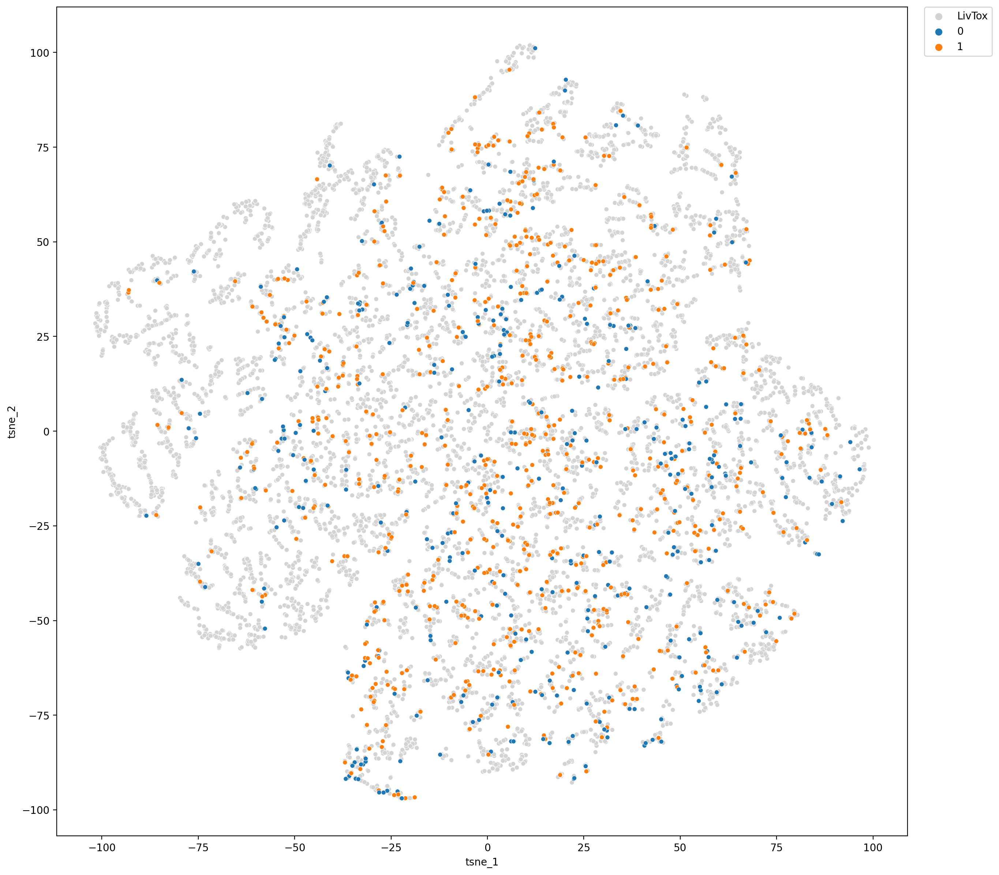

In [3]:
fig, ax = plt.subplots(figsize=(15, 15), dpi=200)
sns.scatterplot(data=df[df["Data"]=="LivTox"], x="tsne_1", y="tsne_2",palette=['lightgrey'], hue="Data",  s=20)
sns.scatterplot(data=df[df["Data"]=="DILI"], x="tsne_1", y="tsne_2", hue="TOXICITY", s=20)
plt.title("")
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0)
plt.show()

In [4]:
df

,smiles_r,Data,DILI,Source_rank,PC1,PC2,tsne_1,tsne_2,TOXICITY
0,C[C@H](N)C(=O)N[C@@H](C)C(=O)NC1[C@@H]2CN(c3nc...,LivTox,NaN,2,2.499252,-0.187490,5.741021,-66.100784,1
1,CN(C)CCCC1c2ccccc2Nc2ccc(Cl)cc21,LivTox,NaN,2,-1.014736,0.922524,-5.393569,64.000760,1
2,NC(N)=Nc1nc(CSCCN=CNS(=O)(=O)c2ccc(Br)cc2)cs1,LivTox,NaN,2,1.872187,0.350456,-5.988792,-46.336258,1
3,O=c1[nH]c(=O)n([C@@H]2O[C@H](CO)[C@@H](O)[C@@H...,LivTox,NaN,2,0.986581,-1.504553,38.166890,-67.287186,1
4,CN1CCCC(CN2c3ccccc3Sc3ccccc32)C1,LivTox,NaN,2,-1.241727,0.781711,-58.635445,31.288782,1
...,...,...,...,...,...,...,...,...,...
16350,NCC(O)c1ccc(O)c(O)c1,DILI,Held-out,1,0.211180,-1.525578,57.363926,-59.691986,0
16351,Cc1nnc(SCC2=C(C(=O)O)N3C(=O)C(NC(=O)Cn4cnnn4)C...,DILI,Held-out,1,2.475875,-0.756200,-1.064525,-63.357120,1
16352,COc1cc(NC(C)CCCN)c2ncccc2c1,DILI,Held-out,1,-0.045551,0.139989,51.367890,1.340094,0
16353,CC12CCC3c4ccc(O)cc4CCC3C1CCC2O,DILI,Held-out,1,-0.909438,-0.053198,61.378930,16.621420,1


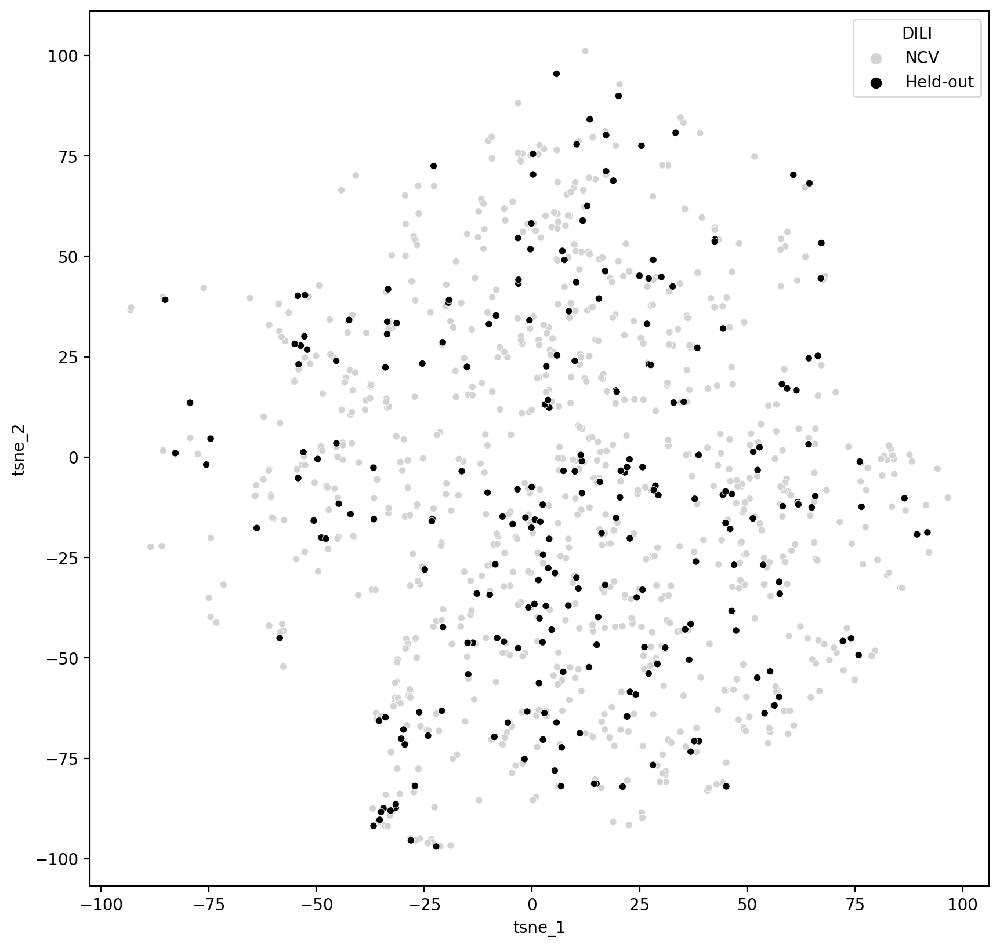

In [5]:
fig, ax = plt.subplots(figsize=(10, 10), dpi=200)
sns.scatterplot(data=df, x="tsne_1", y="tsne_2", palette=['lightgrey', "black"], hue="DILI",  s=20)
plt.title("")
plt.show()

In [9]:
df.sample(50)

,smiles_r,Data,DILI,Source_rank,PC1,PC2,tsne_1,tsne_2,TOXICITY
3735,COc1cc(C(=O)OCCCNCCC(c2ccccc2)c2ccccc2)cc(OC)c1OC,LivTox,NaN,7,0.904639,2.001437,-16.373316,15.022293,1
8183,O=c1[nH]c(=O)n(C2CCCO2)cc1F,LivTox,NaN,14,-0.523109,-1.250944,58.254510,41.540184,0
3463,CN1CC[C@]23c4c5ccc(O)c4O[C@H]2[C@@H](O)C=C[C@H...,LivTox,NaN,7,-0.360416,-0.853649,52.388985,-3.225053,1
11945,CCCCCCCCCC(=O)O,LivTox,NaN,15,-0.896030,0.465556,-38.988632,81.019830,0
4016,CC(C)(C)c1ccccc1O,LivTox,NaN,7,-1.610599,-0.452605,5.400017,98.792240,1
3135,COc1ccccc1O,LivTox,NaN,7,-1.314574,-0.860853,49.532265,59.267372,1
9616,CCOC(=O)[C@H](CCc1ccccc1)N[C@@H](C)C(=O)N1Cc2c...,LivTox,NaN,15,1.685560,0.889650,-3.262532,-36.816810,0
5027,C=CCOC(=O)C(C)(C)OC(=O)c1cc(-n2c(=O)cc(C(F)(F)...,LivTox,NaN,7,0.868099,0.686151,-11.038785,-15.335271,1
6262,O=Cc1ccc(O)n1CCCC(=O)O,LivTox,NaN,8,0.002101,-0.730944,57.710960,-13.606453,0
5107,CC1=NC(C)=C(P2(=O)OCC(C)(C)CO2)C(c2cccc([N+](=...,LivTox,NaN,7,1.697839,2.911787,-24.016605,-41.344920,1


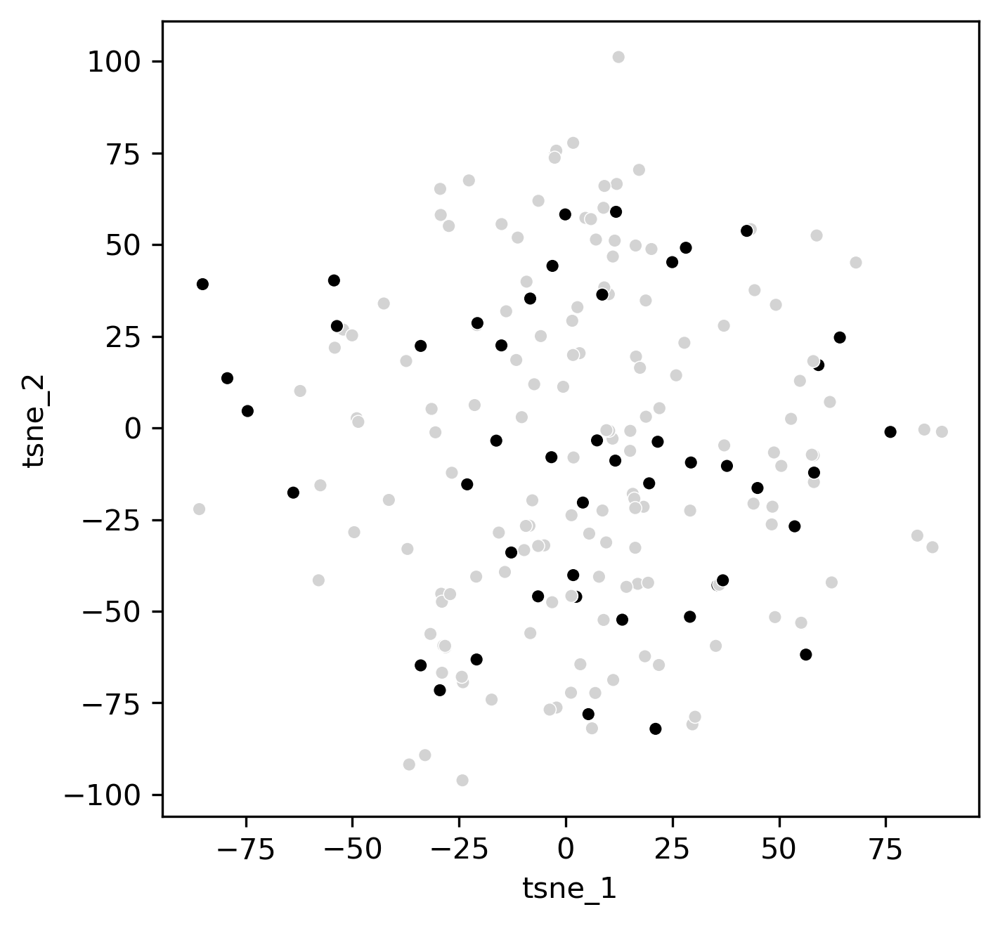

In [38]:
#For AI paper figure
#df_AI = df[df["Data"]=="DILI"].sample(200)
fig, ax = plt.subplots(figsize=(5, 5), dpi=300)
sns.scatterplot(data= df_AI, x="tsne_1", y="tsne_2", palette=['lightgrey', "black"], hue="DILI",  s=20, legend=False)
plt.title("")
plt.show()

In [35]:
df_AI["dummy"] = (df_AI["tsne_2"] < -24.5) & (df_AI["tsne_1"] < 49) & (df_AI["tsne_1"] > -49)

df_AI

,smiles_r,Data,DILI,Source_rank,PC1,PC2,tsne_1,tsne_2,TOXICITY,dummy
15808,CC(C(=O)O)c1ccc2c(c1)Cc1cccnc1O2,DILI,NCV,1,-0.687295,-0.062958,16.390368,49.723778,1,False
15763,Nc1ccc(S(=O)(=O)c2ccc(N)cc2)cc1,DILI,NCV,1,-0.098762,-0.651746,50.532684,-10.372957,1,False
16003,CN(C)CCc1c[nH]c2ccc(CC3COC(=O)N3)cc12,DILI,NCV,1,-0.146778,-0.149812,58.136208,-7.492952,0,False
16081,CC1OC(OC2C(O)CC(OC3C(O)CC(OC4CCC5(C)C(CCC6C5CC...,DILI,NCV,1,4.439780,0.331805,-24.075850,-69.358060,0,True
16170,Cc1ccccc1C(=O)Nc1ccc(C(=O)N2CCCC(O)c3cc(Cl)ccc...,DILI,Held-out,1,-0.071301,1.187040,-8.315924,35.266464,1,False
...,...,...,...,...,...,...,...,...,...,...
15116,NC(CC(=O)N1CCn2c(nnc2C(F)(F)F)C1)Cc1cc(F)c(F)cc1F,DILI,NCV,1,0.275241,0.070197,25.889862,14.332339,1,False
15696,O=C(O)c1cc(N=Nc2ccc(S(=O)(=O)Nc3ccccn3)cc2)ccc1O,DILI,NCV,1,1.400101,0.432717,14.228463,-43.347885,1,True
16104,CC12C=CC(=O)C=C1CCC1C2C(=O)CC2(C)C1CCC2(O)C(=O)CO,DILI,Held-out,1,0.330646,-0.421156,37.792793,-10.372277,1,False
15661,CN(CCCCCCCCCCN(C)C(=O)Oc1ccccc1[N+](C)(C)C)C(=...,DILI,NCV,1,0.646129,3.063507,-29.285270,58.061530,1,False


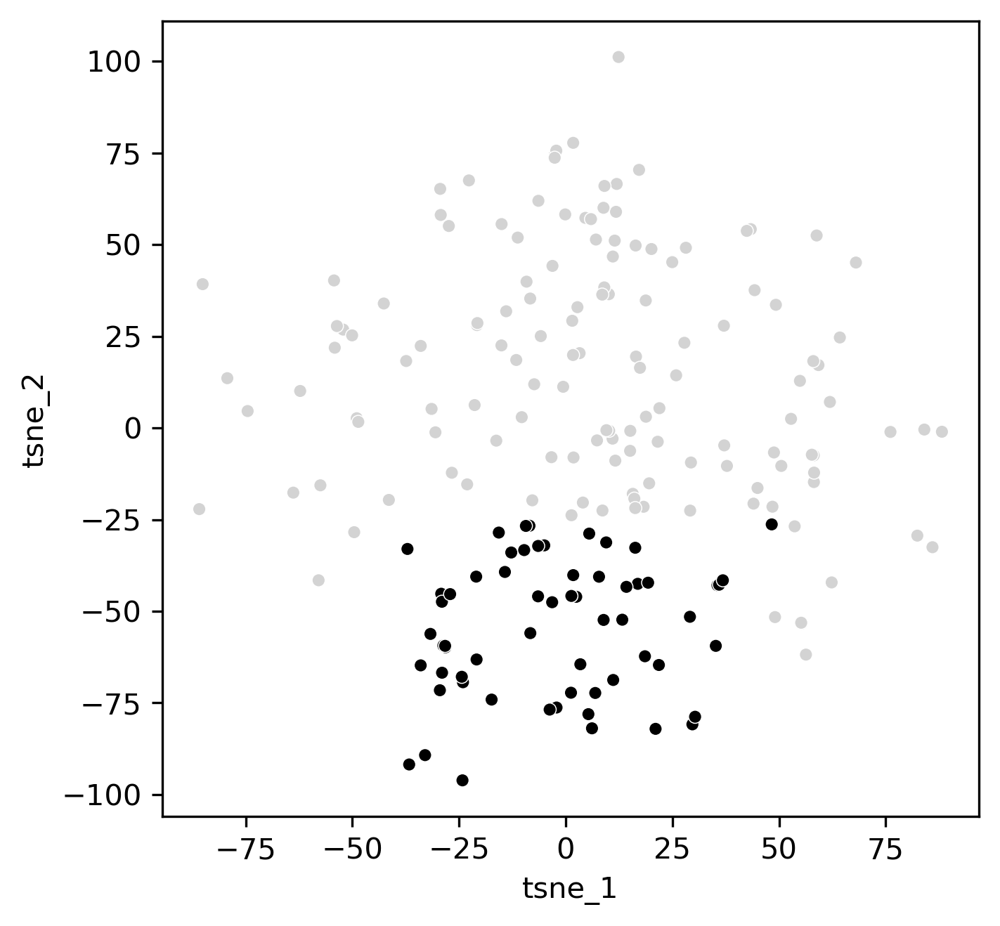

In [37]:
#For AI paper figure

fig, ax = plt.subplots(figsize=(5, 5), dpi=300)
sns.scatterplot(data= df_AI, x="tsne_1", y="tsne_2", palette=['lightgrey', "black"], hue="dummy",  s=20, legend=False)
plt.title("")
plt.show()

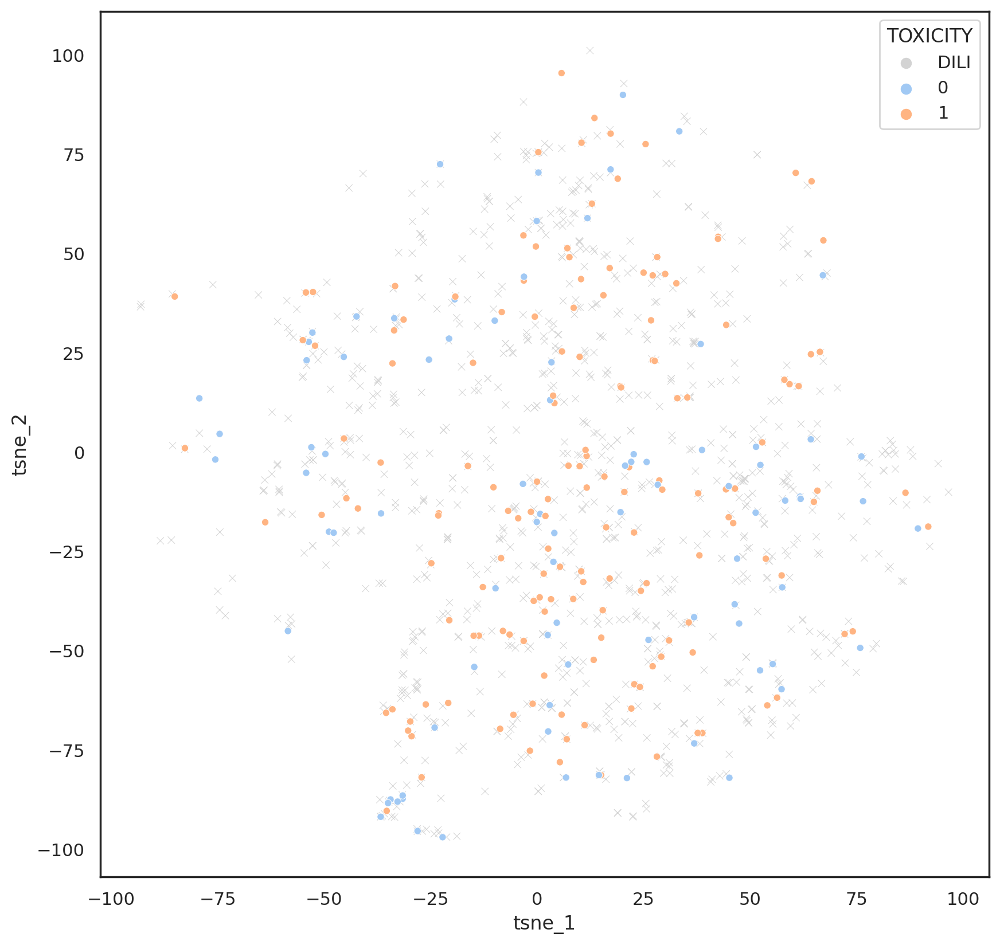

In [25]:
fig, ax = plt.subplots(figsize=(10, 10), dpi=200)
sns.scatterplot(data=df[df["DILI"]=="NCV"], x="tsne_1", y="tsne_2", palette=['lightgrey'], hue="Data",  s=20, marker="x")
sns.scatterplot(data=df[df["DILI"]=="Held-out"], x="tsne_1", y="tsne_2", hue="TOXICITY", s=20)
plt.title("")
plt.show()

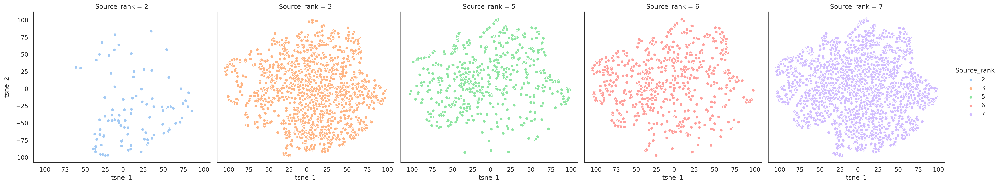

In [22]:
sns.set_theme(style='white', 
              palette='pastel', rc={'figure.dpi': 300, 'figure.figsize': (5, 3.75)})
graph = sns.FacetGrid(df[df.Source_rank.isin([2, 3, 5, 6, 7])], col ="Source_rank", hue="Source_rank", height=5, aspect=1)
# map the above form facetgrid with some attributes
graph.map(plt.scatter, "tsne_1", "tsne_2", edgecolor ="w").add_legend()

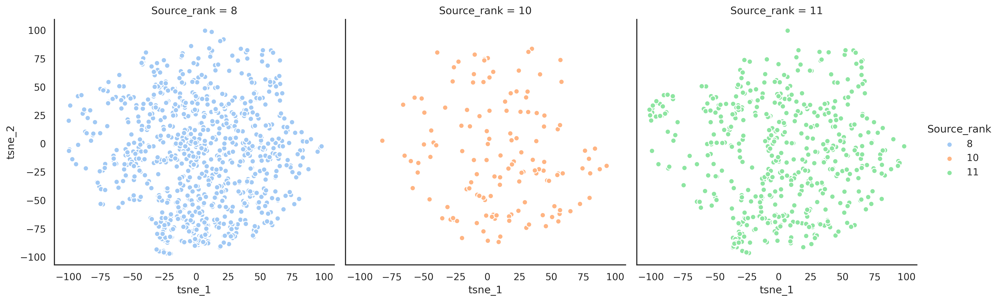

In [39]:
# Form a facetgrid using columns with a hue
graph = sns.FacetGrid(df[df.Source_rank.isin([8, 10, 11])], col ="Source_rank", hue="Source_rank", height=5, aspect=1)
# map the above form facetgrid with some attributes
graph.map(plt.scatter, "tsne_1", "tsne_2", edgecolor ="w").add_legend()

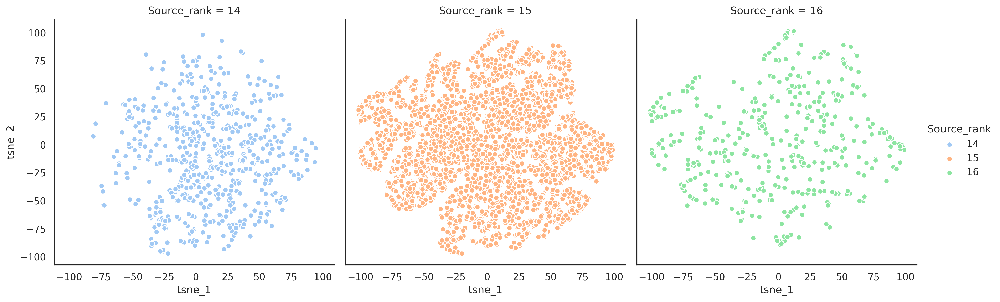

In [40]:
# Form a facetgrid using columns with a hue
graph = sns.FacetGrid(df[df.Source_rank.isin([14, 15, 16])], col ="Source_rank", hue="Source_rank", height=5, aspect=1)
# map the above form facetgrid with some attributes
graph.map(plt.scatter, "tsne_1", "tsne_2", edgecolor ="w").add_legend()

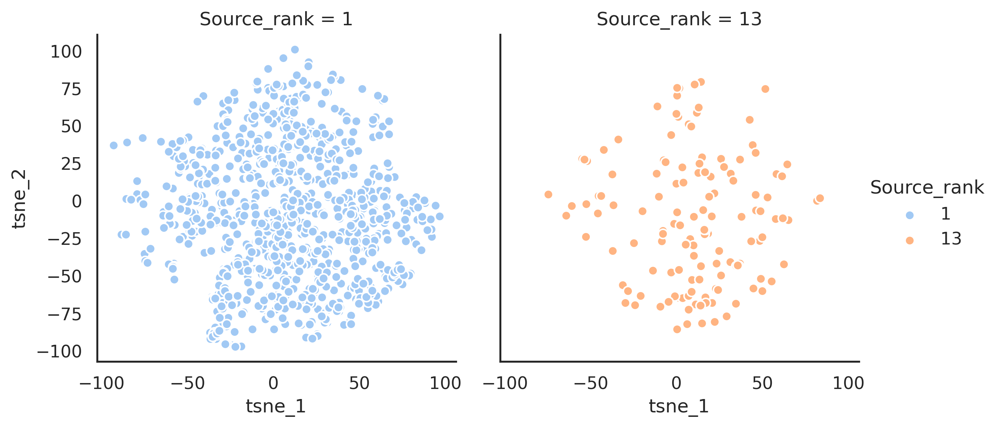

In [41]:
# Form a facetgrid using columns with a hue
graph = sns.FacetGrid(df[df.Source_rank.isin([1, 13])], col ="Source_rank", hue="Source_rank", height=4, aspect=1)
# map the above form facetgrid with some attributes
graph.map(plt.scatter, "tsne_1", "tsne_2", edgecolor ="w").add_legend()